<a href="https://colab.research.google.com/github/williamyip/Oil-Palm-Seeds-Detection-and-Classification/blob/main/Oil_Palm_Seeds_Detection_and_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Oil Palm Seed Detection and Classification

---

## Introduction
Object detection and classification is a classic problem in computer vision. It has been
widely applied in various fields, e.g., biometrics, surveillance, industry production
control. Object detection usually requires output the bounding box of detected object
and the label of its object type. On the other hand, image classification requires to
produce object type(s) as the output for a given input image. 

## Objectives
In this project, I attempt to apply object detection and image classification
techniques to detect oil palm seeds that are present in an image and classify each of
them into category of good or bad quality.

## Dataset
There are in total 110 images of good quality oil palm seeds and 105 images of bad
quality seeds. Each image contains 10 oil palm seeds of the same category. The
images are stored in two different folders “/GoodSeed” and “/BadSeed” which are
accessible at [here](https://drive.google.com/drive/folders1am1DG21TZJ8fiYNPADPoc04N9JkB8Cy8?usp=sharing).

You should keep a separate testing dataset which must contain 20 images of good
quality seeds and 20 images of bad quality seeds, respectively. The specific image
files that should be included in the testing dataset are specified in “testdata.csv” file
accessible at [here](https://drive.google.com/drive/folders/1UcFoMGnBto_8lj90srdeKiM8PxeNYk8V?usp=sharing).

##Requirements
1. Design a method to locate each oil palm seed present in an image and classify
it into the category of good or bad quality.
2. The method should be able to output a bounding box (rectangular or circle)
for each of the oil palm seed detected.
3. The method should be able to output a label as to whether the oil palm seed
detected is of good quality or bad quality. The label can either be text-based,
or colour based.
4. Evaluate the method both quantitatively and qualitatively for
detection and classification accuracy.
7. Design new method for locating and classifying oil palm
seeds.
8. Only use the training dataset for designing and developing the
method.
9. Use the testing dataset for evaluating the method. The ground
truth of the testing dataset should not be part of the input to the program and
should only be used as part of the evaluation on the results obtained for the
testing dataset.
. 

## Installation of libraries

In [ ]:
# Time operations within each cell
import os, time
os.environ['TZ'] = 'Asia/Kuala_Lumpur'
time.tzset()

!pip install ipython-autotime
%load_ext autotime

# For SIFT feature extraction
!pip install opencv-contrib-python==4.4.0.44

# Progress bar
from tqdm.notebook import tqdm

     |████████████████████████████████| 55.7MB 67kB/s 
  Found existing installation: opencv-contrib-python 4.1.2.30
    Uninstalling opencv-contrib-python-4.1.2.30:
      Successfully uninstalled opencv-contrib-python-4.1.2.30
time: 12.3 s (started: 2021-04-09 23:18:13 +08:00)


## Upload ground truth for bounding boxes
Upload CSV file with the filename `bounding_boxes_ground_truth.csv`

In [ ]:
# Upload ground truth for bounding boxes
from google.colab import files
uploaded = files.upload()

Saving bounding_boxes_ground_truth.csv to bounding_boxes_ground_truth.csv
time: 8.34 s (started: 2021-04-09 23:18:25 +08:00)


## Dataset preparation

### Download and unzip dataset to Google Colab's instance

In [ ]:
!gdown --id '1YnADtaxXRp7OhfgBON9v9xCMWQN03u-6'
!rm -rf 'seed'
!unzip -o 'seed.zip'

Downloading...
From: https://drive.google.com/uc?id=1YnADtaxXRp7OhfgBON9v9xCMWQN03u-6
To: /content/seed.zip
1.21GB [00:12, 93.6MB/s]
Archive:  seed.zip
  inflating: seed/BadSeed/BadSeed100.jpg  
  inflating: seed/BadSeed/BadSeed99.jpg  
  inflating: seed/BadSeed/BadSeed102.jpg  
  inflating: seed/GoodSeed/GoodSeed97.jpg  
  inflating: seed/GoodSeed/GoodSeed87.jpg  
  inflating: seed/GoodSeed/GoodSeed98.jpg  
  inflating: seed/BadSeed/BadSeed101.jpg  
  inflating: seed/GoodSeed/GoodSeed104.jpg  
  inflating: seed/GoodSeed/GoodSeed100.jpg  
  inflating: seed/GoodSeed/GoodSeed99.jpg  
  inflating: seed/GoodSeed/GoodSeed96.jpg  
  inflating: seed/GoodSeed/GoodSeed94.jpg  
  inflating: seed/BadSeed/BadSeed104.jpg  
  inflating: seed/GoodSeed/GoodSeed108.jpg  
  inflating: seed/GoodSeed/GoodSeed93.jpg  
  inflating: seed/GoodSeed/GoodSeed86.jpg  
  inflating: seed/GoodSeed/GoodSeed85.jpg  
  inflating: seed/BadSeed/BadSeed103.jpg  
  inflating: seed/GoodSeed/GoodSeed88.jpg  
  inflating: see

### Create necessary directories

In [ ]:
import os

if not os.path.exists('seed/BadSeedBound/'):
    os.mkdir('seed/BadSeedBound/')
if not os.path.exists('seed/GoodSeedBound/'):
    os.mkdir('seed/GoodSeedBound/')
if not os.path.exists('seed/BadSeedBoundTest/'):
    os.mkdir('seed/BadSeedBoundTest/')
if not os.path.exists('seed/GoodSeedBoundTest/'):
    os.mkdir('seed/GoodSeedBoundTest/')
if not os.path.exists('seed/BadSeedCropped/'):
    os.mkdir('seed/BadSeedCropped/')
if not os.path.exists('seed/GoodSeedCropped/'):
    os.mkdir('seed/GoodSeedCropped/')

time: 22.1 ms (started: 2021-04-09 23:19:18 +08:00)


### Create CSV files

In [ ]:
import csv

with open('seed.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["folder_path", "filename", "label"])

    for filename in enumerate(os.listdir('seed/BadSeed/')):
        writer.writerow(["seed/BadSeed/", filename[1], 0])

    for filename in enumerate(os.listdir('seed/GoodSeed/')):
        writer.writerow(["seed/GoodSeed/", filename[1], 1])

with open('bounding_boxes_prediction.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["folder_path", "original_image_name", "seed_name", "x", "y", "dx", "dy"])

time: 41.9 ms (started: 2021-04-09 23:19:18 +08:00)


### Read `seed.csv` file

In [ ]:
import pandas as pd
df = pd.read_csv('seed.csv')
df

,folder_path,filename,label
0,seed/BadSeed/,BadSeed9.jpg,0
1,seed/BadSeed/,BadSeed58.jpg,0
2,seed/BadSeed/,BadSeed8.jpg,0
3,seed/BadSeed/,BadSeed72.jpg,0
4,seed/BadSeed/,BadSeed102.jpg,0
...,...,...,...
209,seed/GoodSeed/,GoodSeed29.jpg,1
210,seed/GoodSeed/,GoodSeed0.jpg,1
211,seed/GoodSeed/,GoodSeed88.jpg,1
212,seed/GoodSeed/,GoodSeed24.jpg,1


time: 106 ms (started: 2021-04-09 23:19:18 +08:00)


### Function to make `imshow` faster when needed
Change `scaling_factor` to a value in the range (0, 1]. When `scaling_factor` is lower, `imshow` will be faster.

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

def imshow(image):
    scaling_factor = 0.2
    if scaling_factor != 1:
        height = int(image.shape[0] * scaling_factor)
        width = int(image.shape[1] * scaling_factor)
        return cv2_imshow(cv2.resize(cv2.cvtColor(image, cv2.COLOR_RGB2BGR), (width, height)))
    else:
        return cv2_imshow(cv2.cvtColor(image, cv2.COLOR_RGB2BGR))

time: 109 ms (started: 2021-04-09 23:19:18 +08:00)


## Seed detection

### Function for image pre-processing
Parameters:
> `path` : *str*

>> Image path.

> `display` : *bool, default=False*

>> Display seed mask.

Returns:
> `seed_mask` : *ndarray*

>> Seed mask for image segmentation.

In [ ]:
import numpy as np

def pre_process(path, display=False):
    image = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)

    kernel15 = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 15))

    # Convert image to HSV
    image_hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

    # Get seed part 1
    # Otsu's thresholding on saturation channel
    _, seed_part_1_otsu = cv2.threshold(image_hsv[:,:,1], 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Morphological closing to get main seed parts
    seed_part_1_closing = cv2.morphologyEx(seed_part_1_otsu, cv2.MORPH_CLOSE, kernel15)

    # Get seed part 2
    # Morphological dilation on value channel
    seed_part_2_dilated = cv2.dilate(image_hsv[:,:,2], kernel15)

    # Gaussian blur to smoothen image
    seed_part_2_gaussian = cv2.GaussianBlur(seed_part_2_dilated, (15, 15), 0)

    # Compute difference to get edges
    seed_part_2_diff = cv2.absdiff(image_hsv[:,:,2], seed_part_2_gaussian)

    # Otsu's thresholding to get clear edges
    _, seed_part_2_otsu = cv2.threshold(seed_part_2_diff, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Get seed part 3
    # Canny edge detection
    seed_part_3_canny = cv2.Canny(image_hsv[:,:,1], 100, 200)

    # Morphological closing to get main seed parts
    seed_part_3_closing = cv2.morphologyEx(seed_part_3_canny, cv2.MORPH_CLOSE, kernel15)

    # Combine seed parts
    seed_combined = np.clip(seed_part_1_otsu + seed_part_1_closing + seed_part_2_otsu + seed_part_3_closing, 0, 255)

    # Morphological closing to get main seed parts
    seed_closing = cv2.morphologyEx(seed_combined, cv2.MORPH_CLOSE, kernel15)

    # Fill holes from point (0, 0)
    mask_fill_holes = np.zeros((seed_closing.shape[0] + 2, seed_closing.shape[1] + 2), np.uint8)
    seed_fill = seed_closing.copy()
    cv2.floodFill(seed_fill, mask_fill_holes, (0, 0), 255)

    # Invert floodfilled image
    seed_fill_inv = ~seed_fill

    # Combine the two images to get the foreground.
    seed_mask = seed_closing | seed_fill_inv

    # Display seed mask
    if display:
        print(path.rsplit('/', 2)[2])
        imshow(seed_mask)
        print("\n")

    return seed_mask

time: 42.9 ms (started: 2021-04-09 23:19:18 +08:00)


### Function for image segmentation
Parameters:
> `path` : *str*

>> Image path.

> `seed_mask` : *ndarray*

>> Seed mask generated from `pre_process` function.

> `display_segmented` : *bool, default=False*

>> Display segmented seeds.

> `display_bound` : *bool, default=False*

>> Display images with seed bounding boxes.

In [ ]:
def segment(path, seed_mask, display_segmented=False, display_bound=False):
    # Find seed edges
    seed_contours, _ = cv2.findContours(seed_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    seed_contours_filter = list(filter(lambda contour: (cv2.boundingRect(contour)[2] < 1500) and (cv2.boundingRect(contour)[3] < 1500), seed_contours))
    seed_contours_10 = sorted(seed_contours_filter, key=cv2.contourArea)[-10:]
    sorted_seed_contours = sorted(seed_contours_10, key=lambda contour: cv2.boundingRect(contour)[0])

    # Get seed bounding boxes
    seed_bound = [None] * len(sorted_seed_contours)
    for i, contours in enumerate(sorted_seed_contours):
        seed_bound[i] = cv2.boundingRect(contours)

    # Overlay seed bounding boxes
    image = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    image_seed_bound = image.copy()
    bound_padding = 5
    folder_name_cropped = path.rsplit('/', 2)[1] + "Cropped"
    folder_name_bound = path.rsplit('/', 2)[1] + "Bound"
    filename = path.rsplit('/', 2)[2][:-4]
    for i in range(len(sorted_seed_contours)):
        cv2.rectangle(image_seed_bound, (int(seed_bound[i][0] - bound_padding), int(seed_bound[i][1] - bound_padding)), (int(seed_bound[i][0] + seed_bound[i][2] + bound_padding), int(seed_bound[i][1] + seed_bound[i][3] + bound_padding)), (255, 0, 0), 2)
        seed_segmented = image[seed_bound[i][1]:seed_bound[i][1] + seed_bound[i][3], seed_bound[i][0]:seed_bound[i][0] + seed_bound[i][2]]
        cv2.imwrite('seed/' + folder_name_cropped + '/' + filename + '_' + str(i) + '.jpg', cv2.cvtColor(seed_segmented, cv2.COLOR_RGB2BGR))
        if display_segmented:
            print(filename + "_" + str(i) + ".jpg")
            imshow(seed_segmented)
            print("\n")

        with open('bounding_boxes_prediction.csv', 'a', newline='') as file:
            writer = csv.writer(file)
            writer.writerow(["seed/" + folder_name_cropped + "/", filename + ".jpg", filename + "_" + str(i) + ".jpg", seed_bound[i][0], seed_bound[i][1], seed_bound[i][2], seed_bound[i][3]])

    cv2.imwrite("seed/" + folder_name_bound + "/" + filename + ".jpg", cv2.cvtColor(image_seed_bound, cv2.COLOR_RGB2BGR))
    if display_bound:
        print(filename + ".jpg")
        imshow(image_seed_bound)
        print("\n")

time: 45.9 ms (started: 2021-04-09 23:19:18 +08:00)


### Pre-process and segment seed images

In [ ]:
for i, df_row in tqdm(df.iterrows(), desc="Pre-processing and segmentation", total=df.shape[0], unit="image"):
    seed_mask = pre_process(df_row['folder_path'] + df_row['filename'])
    segment(df_row['folder_path'] + df_row['filename'], seed_mask)


time: 5min 53s (started: 2021-04-09 23:19:18 +08:00)


### Read `bounding_boxes_prediction.csv` file

In [ ]:
df_bounding_boxes_prediction = pd.read_csv('bounding_boxes_prediction.csv')
df_bounding_boxes_prediction

,folder_path,original_image_name,seed_name,x,y,dx,dy
0,seed/BadSeedCropped/,BadSeed9.jpg,BadSeed9_0.jpg,776,1914,241,263
1,seed/BadSeedCropped/,BadSeed9.jpg,BadSeed9_1.jpg,1181,1949,263,223
2,seed/BadSeedCropped/,BadSeed9.jpg,BadSeed9_2.jpg,1554,1846,273,316
3,seed/BadSeedCropped/,BadSeed9.jpg,BadSeed9_3.jpg,2029,1904,220,260
4,seed/BadSeedCropped/,BadSeed9.jpg,BadSeed9_4.jpg,2418,1903,279,301
...,...,...,...,...,...,...,...
2135,seed/GoodSeedCropped/,GoodSeed55.jpg,GoodSeed55_5.jpg,3059,2073,215,329
2136,seed/GoodSeedCropped/,GoodSeed55.jpg,GoodSeed55_6.jpg,3378,2127,322,227
2137,seed/GoodSeedCropped/,GoodSeed55.jpg,GoodSeed55_7.jpg,3842,2045,293,303
2138,seed/GoodSeedCropped/,GoodSeed55.jpg,GoodSeed55_8.jpg,4214,1951,352,412


time: 41.9 ms (started: 2021-04-09 23:25:12 +08:00)


### Read `bounding_boxes_ground_truth.csv` file

In [ ]:
df_bounding_boxes_ground_truth = pd.read_csv('bounding_boxes_ground_truth.csv')
df_bounding_boxes_ground_truth

,folder_path,original_image_name,seed_name,x,y,dx,dy
0,seed/BadSeedCropped/,BadSeed0.jpg,BadSeed0_0.jpg,636,1831,275,263
1,seed/BadSeedCropped/,BadSeed0.jpg,BadSeed0_1.jpg,1029,1827,239,270
2,seed/BadSeedCropped/,BadSeed0.jpg,BadSeed0_2.jpg,1398,1807,277,286
3,seed/BadSeedCropped/,BadSeed0.jpg,BadSeed0_3.jpg,1786,1816,320,286
4,seed/BadSeedCropped/,BadSeed0.jpg,BadSeed0_4.jpg,2212,1829,259,268
...,...,...,...,...,...,...,...
396,seed/GoodSeedCropped/,GoodSeed19.jpg,GoodSeed19_6.jpg,3510,2101,267,276
397,seed/GoodSeedCropped/,GoodSeed19.jpg,GoodSeed19_7.jpg,3980,2078,320,302
398,seed/GoodSeedCropped/,GoodSeed19.jpg,GoodSeed19_8.jpg,4461,2063,252,285
399,seed/GoodSeedCropped/,GoodSeed19.jpg,GoodSeed19_9.jpg,4801,2089,334,273


time: 45.4 ms (started: 2021-04-09 23:25:12 +08:00)


### Function for intersection over union (IOU) calculation
Parameters:
> `boxA` : *tuple*

>> First rectangle's dimensions in a tuple of 4 elements. `(x-coordinate, y-coordinate, dx, dy)`.

> `boxB` : *tuple*

>> Second rectangle's dimensions in a tuple of 4 elements. `(x-coordinate, y-coordinate, dx, dy)`.

Returns:

> `iou` : *float64*

>> Area of intersection over union of rectangles.

In [ ]:
def intersection_over_union(boxA, boxB):
    # Determine the (x, y)-coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[0] + boxA[2], boxB[0] + boxB[2])
    yB = min(boxA[1] + boxA[3], boxB[1] + boxB[3])

    # Compute the area of intersection rectangle
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

    # Compute the area of both the prediction and ground truth rectangles
    boxAArea = boxA[2] * boxA[3]
    boxBArea = boxB[2] * boxB[3]
    iou = interArea / float(boxAArea + boxBArea - interArea)

    return iou

time: 13 ms (started: 2021-04-09 23:25:12 +08:00)


### Evaluate seed detection accuracy using IOU on prediction and ground truth seed bounding boxes

In [ ]:
detection_accuracy = []

for seed_name in df_bounding_boxes_ground_truth['seed_name'].values.tolist():
    box_ground_truth = (df_bounding_boxes_ground_truth[df_bounding_boxes_ground_truth['seed_name'] == seed_name]['x'].values[0], df_bounding_boxes_ground_truth[df_bounding_boxes_ground_truth['seed_name'] == seed_name]['y'].values[0], df_bounding_boxes_ground_truth[df_bounding_boxes_ground_truth['seed_name'] == seed_name]['dx'].values[0], df_bounding_boxes_ground_truth[df_bounding_boxes_ground_truth['seed_name'] == seed_name]['dy'].values[0])
    if not df_bounding_boxes_prediction[df_bounding_boxes_prediction['seed_name'] == seed_name].empty:
        box_prediction = (df_bounding_boxes_prediction[df_bounding_boxes_prediction['seed_name'] == seed_name]['x'].values[0], df_bounding_boxes_prediction[df_bounding_boxes_prediction['seed_name'] == seed_name]['y'].values[0], df_bounding_boxes_prediction[df_bounding_boxes_prediction['seed_name'] == seed_name]['dx'].values[0], df_bounding_boxes_prediction[df_bounding_boxes_prediction['seed_name'] == seed_name]['dy'].values[0])
    else:
        box_prediction = (0, 0, 0, 0)
    detection_accuracy.append(intersection_over_union(box_ground_truth, box_prediction))

print("Average seed detection accuracy: " + str(sum(detection_accuracy)/len(detection_accuracy)))

Average seed detection accuracy: 0.9327820820859253
time: 2.17 s (started: 2021-04-09 23:25:12 +08:00)


### Function to overlay ground truth for seed bounding boxes
Parameters:
> `folder_path` : *str*

>> Folder path for cropped seed images.

> `original_image_name` : *str*

>> Original image name before seeds are cropped.

> `display` : *bool, default=False*

>> Display images with ground truth seed bounding boxes.

In [ ]:
def overlay_bounding_boxes_ground_truth(folder_path, original_image_name, display=False):
    folder_name_bound = folder_path.rsplit('/', 2)[1][:-7] + "Bound"
    image = cv2.cvtColor(cv2.imread('seed/' + folder_name_bound + '/' + original_image_name), cv2.COLOR_BGR2RGB)
    image_seed_bound = image.copy()
    for seed_name in df_bounding_boxes_ground_truth[df_bounding_boxes_ground_truth['original_image_name'] == original_image_name]['seed_name']:
        cv2.rectangle(image_seed_bound, (int(df_bounding_boxes_ground_truth[df_bounding_boxes_ground_truth['seed_name'] == seed_name]['x']), int(df_bounding_boxes_ground_truth[df_bounding_boxes_ground_truth['seed_name'] == seed_name]['y'])), (int(df_bounding_boxes_ground_truth[df_bounding_boxes_ground_truth['seed_name'] == seed_name]['x'] + df_bounding_boxes_ground_truth[df_bounding_boxes_ground_truth['seed_name'] == seed_name]['dx']), int(df_bounding_boxes_ground_truth[df_bounding_boxes_ground_truth['seed_name'] == seed_name]['y'] + df_bounding_boxes_ground_truth[df_bounding_boxes_ground_truth['seed_name'] == seed_name]['dy'])), (0, 255, 0), 2)
    cv2.imwrite('seed/' + folder_name_bound + 'Test/' + original_image_name, cv2.cvtColor(image_seed_bound, cv2.COLOR_RGB2BGR))
    if display:
        print(original_image_name)
        imshow(image_seed_bound)
        print("\n")

time: 8.93 ms (started: 2021-04-09 23:25:14 +08:00)


### Overlay ground truth for seed bounding boxes

In [ ]:
for folder_path, original_image_name in tqdm(df_bounding_boxes_ground_truth.set_index(['folder_path', 'original_image_name']).index.unique(), desc="Overlaying bounding boxes", unit="image"):
    overlay_bounding_boxes_ground_truth(folder_path, original_image_name)


time: 30.5 s (started: 2021-04-09 23:25:14 +08:00)


### Function to get the smallest seed image dimension
Returns:
> `smallest_height` : *int*

>> Smallest height among all valid seed images.

> `smallest_width` : *int*

>> Smallest width among all valid seed images.

In [ ]:
def get_smallest_seed_dimension():
    smallest_height, smallest_width = 1000, 1000
    for path, filename in zip(df['folder_path'], df['filename']):
        fullpath = path[:-1] + "Cropped/" + filename
        for i in range(10):
            image = cv2.imread(fullpath[:-4] + "_" + str(i) + ".jpg")
            if image.shape[0] < smallest_height and image.shape[0] > 100:
                smallest_height = image.shape[0]
            if image.shape[1] < smallest_width and image.shape[1] > 100:
                smallest_width = image.shape[1]
    return smallest_height, smallest_width

time: 9.74 ms (started: 2021-04-09 23:25:44 +08:00)


### Get smallest seed image dimension

In [ ]:
smallest_height, smallest_width = get_smallest_seed_dimension()
print(smallest_height, smallest_width)

200 187
time: 3.49 s (started: 2021-04-09 23:25:44 +08:00)


## Seed classification

### Function for feature extraction
Parameter:
> `descriptor` : *{'HOG', 'LBP', 'SIFT'}*

>> Feature descriptor to be used.

Returns:
> `output` : *dict*

>> Output for the corresponding feature descriptor.

In [ ]:
# Importing the necessary libraries
from skimage import feature
import re

# Seed for random number generator
np.random.seed(10)

# Function for feature extraction
def feature_ext(descriptor):

    bad_features = []
    good_features = []
    output = {'train': {'good': {'descriptor': [], 'label': []}, 'bad': {'descriptor': [], 'label': []}}, 'test': {'good': {'descriptor': [], 'label': []}, 'bad': {'descriptor': [], 'label': []}}}

    for path, filename in tqdm(zip(df['folder_path'], df['filename']), desc=descriptor + " feature extraction", total=df.shape[0], unit="image"):
        fullpath = path[:-1] + "Cropped/" + filename
        for i in range(10):
            image = cv2.cvtColor(cv2.imread(fullpath[:-4] + "_" + str(i) + ".jpg"), cv2.COLOR_BGR2YCrCb)
            filename = fullpath.rsplit('/', 2)[2]

            # Error handling for invalid seed images
            if image.shape < (20, 20, 3):
                print(fullpath[:-4] + "_" + str(i) + ".jpg is not a valid seed image!")
                image = np.zeros((256, 352, 3), np.uint8)
            else:
                image = cv2.resize(image, (256, 352))

            image_gray = cv2.cvtColor(cv2.cvtColor(image, cv2.COLOR_YCrCb2RGB), cv2.COLOR_RGB2GRAY)

            # Check which descriptor is used
            # HOG Feature Descriptor
            if descriptor == 'HOG':
                fd = feature.hog(image, orientations=9, pixels_per_cell=(16, 16), cells_per_block=(10, 10), visualize=False, multichannel=True)

                if filename.startswith("Bad"):
                    bad_features = fd
                elif filename.startswith("Good"):
                    good_features = fd

            # LBP Feature Descriptor
            elif descriptor == 'LBP':
                radius = 15
                numPoints = 8 * radius
                
                lbp = feature.local_binary_pattern(image_gray, numPoints, radius, method='uniform')
                hist, _ = np.histogram(lbp.ravel(), bins=range(0, numPoints + 3), range=(0, numPoints + 2))

                # Normalising the histograms
                eps = 1e-7
                hist = hist.astype("float")
                hist /= (hist.sum() + eps)

                if filename.startswith("Bad"):
                    bad_features = hist
                elif filename.startswith("Good"):
                    good_features = hist

            # SIFT Feature Descriptor
            elif descriptor == 'SIFT':
                sift = cv2.xfeatures2d.SIFT_create()
                keypoints, descriptors = sift.detectAndCompute(image_gray, None)

                if (descriptors is None):
                    descriptors = np.zeros((128, 128))
                descriptors, _ = np.histogram(descriptors, 128)

                # Normalising the histograms
                eps = 1e-7
                descriptors = descriptors.astype("float")
                descriptors /= (descriptors.sum() + eps)

                if filename.startswith("Bad"):
                    bad_features = descriptors
                elif filename.startswith("Good"):
                    good_features = descriptors

            if filename.startswith("Bad"):
                if int(re.findall(r'\d+', filename)[-1]) in range(21):
                    output['test']['bad']['descriptor'].append(bad_features)
                    output['test']['bad']['label'].append(0)
                else:
                    output['train']['bad']['descriptor'].append(bad_features)
                    output['train']['bad']['label'].append(0)
            elif filename.startswith("Good"):
                if int(re.findall(r'\d+', filename)[-1]) in range(20):
                    output['test']['good']['descriptor'].append(good_features)
                    output['test']['good']['label'].append(1)
                else:
                    output['train']['good']['descriptor'].append(good_features)
                    output['train']['good']['label'].append(1)

    return output

time: 1.5 s (started: 2021-04-09 23:25:48 +08:00)


### Extract seed features

In [ ]:
hog_output = feature_ext('HOG')
lbp_output = feature_ext('LBP')
sift_output = feature_ext('SIFT')

seed/GoodSeedCropped/GoodSeed37_1.jpg is not a valid seed image!
seed/GoodSeedCropped/GoodSeed65_9.jpg is not a valid seed image!
seed/GoodSeedCropped/GoodSeed89_3.jpg is not a valid seed image!
seed/GoodSeedCropped/GoodSeed62_7.jpg is not a valid seed image!
seed/GoodSeedCropped/GoodSeed88_3.jpg is not a valid seed image!



seed/GoodSeedCropped/GoodSeed37_1.jpg is not a valid seed image!
seed/GoodSeedCropped/GoodSeed65_9.jpg is not a valid seed image!
seed/GoodSeedCropped/GoodSeed89_3.jpg is not a valid seed image!
seed/GoodSeedCropped/GoodSeed62_7.jpg is not a valid seed image!
seed/GoodSeedCropped/GoodSeed88_3.jpg is not a valid seed image!



seed/GoodSeedCropped/GoodSeed37_1.jpg is not a valid seed image!
seed/GoodSeedCropped/GoodSeed65_9.jpg is not a valid seed image!
seed/GoodSeedCropped/GoodSeed89_3.jpg is not a valid seed image!
seed/GoodSeedCropped/GoodSeed62_7.jpg is not a valid seed image!
seed/GoodSeedCropped/GoodSeed88_3.jpg is not a valid seed image!

time: 9min 5s (started: 2021-04-09 23:25:49 +08:00)


### Function to randomise and compile dataset
Parameters:
> `descriptor` : *{'hog', 'lbp', 'sift'}*

>> Feature descriptor to be used.

> `output` : *dict*

>> Output for the corresponding feature descriptor.

In [ ]:
def randomise_compile_data(descriptor, output):
    rand_perm = np.random.permutation(len(output['train']['bad']['descriptor'] + output['train']['good']['descriptor']))
    data[descriptor]['train']['descriptor'] = np.array(output['train']['bad']['descriptor'] + output['train']['good']['descriptor'])[rand_perm]
    data[descriptor]['train']['label'] = np.array(output['train']['bad']['label'] + output['train']['good']['label'])[rand_perm]
    data[descriptor]['test']['descriptor'] = np.array(output['test']['bad']['descriptor'] + output['test']['good']['descriptor'])
    data[descriptor]['test']['label'] = np.array(output['test']['bad']['label'] + output['test']['good']['label'])

time: 7.3 ms (started: 2021-04-09 23:34:55 +08:00)


### Randomise and compile dataset

In [ ]:
data = {'hog': {'train': {'descriptor': [], 'label': []}, 'test': {'descriptor': [], 'label': []}}, 'lbp': {'train': {'descriptor': [], 'label': []}, 'test': {'descriptor': [], 'label': []}}, 'sift': {'train': {'descriptor': [], 'label': []}, 'test': {'descriptor': [], 'label': []}}}

randomise_compile_data('hog', hog_output)
randomise_compile_data('lbp', lbp_output)
randomise_compile_data('sift', sift_output)

time: 2.82 s (started: 2021-04-09 23:34:55 +08:00)


### Function for support vector machine (SVM) classification
Parameters:
> `x_train` : *ndarray*

>> Features for training set.

> `y_train` : *ndarray*

>> Labels for training set.

> `x_test` : *ndarray*

>> Features for test set.

Returns:
> `clf` : *sklearn.svm._classes.SVC*

>> Trained SVM classifier model.

> `y_pred` : *ndarray*

>> Predicted labels for test set.

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn import svm

def svm_classifier(x_train, y_train, x_test):
    scaler = StandardScaler()
    x_train = scaler.fit_transform(x_train)
    x_test = scaler.fit_transform(x_test)

    clf = svm.SVC()
    clf.fit(x_train, y_train)
    y_pred = clf.predict(x_test)

    return clf, y_pred

time: 435 ms (started: 2021-04-09 23:34:58 +08:00)


### Classify seed images using SVM
*Note: Classifying seed images will take around 9 minutes.*

In [ ]:
_, hog_y_pred = svm_classifier(data['hog']['train']['descriptor'], data['hog']['train']['label'], data['hog']['test']['descriptor'])
_, lbp_y_pred = svm_classifier(data['lbp']['train']['descriptor'], data['lbp']['train']['label'], data['lbp']['test']['descriptor'])
_, sift_y_pred = svm_classifier(data['sift']['train']['descriptor'], data['sift']['train']['label'], data['sift']['test']['descriptor'])

time: 8min 40s (started: 2021-04-09 23:34:58 +08:00)


### Function for seed classification evaluation
Parameters:
> `descriptor` : *{'HOG', 'LBP', 'SIFT', 'HOG, LBP and SIFT'}*

>> Feature descriptor to be evaluated.

> `y_test` : *ndarray*

>> Actual labels for test set.

> `y_pred` : *ndarray*

>> Predicted labels for test set.

In [ ]:
from sklearn.metrics import accuracy_score, classification_report

def evaluate_classification(descriptor, y_test, y_pred):
    labels = ['Bad Seed (0)', 'Good Seed (1)']
    print("==================================================\n")
    print("Classification using " + descriptor + "\n")
    print("Accuracy: " + str(accuracy_score(y_test, y_pred)) + "\n")
    print(classification_report(y_test, y_pred, target_names=labels, zero_division=0))

time: 4.99 ms (started: 2021-04-09 23:43:39 +08:00)


### Evaluate seed classification and display classification analytics

In [ ]:
evaluate_classification('HOG', data['hog']['test']['label'], hog_y_pred)
evaluate_classification('LBP', data['lbp']['test']['label'], lbp_y_pred)
evaluate_classification('SIFT', data['sift']['test']['label'], sift_y_pred)

# Group and average predictions from all feature descriptors
y_pred = np.mean([hog_y_pred, lbp_y_pred, sift_y_pred], axis=0)

# Convert predictions to binary values
y_pred = np.rint(y_pred).astype(int)

evaluate_classification('HOG, LBP and SIFT', data['hog']['test']['label'], y_pred)


Classification using HOG

Accuracy: 0.7625

               precision    recall  f1-score   support

 Bad Seed (0)       0.78      0.72      0.75       200
Good Seed (1)       0.74      0.80      0.77       200

     accuracy                           0.76       400
    macro avg       0.76      0.76      0.76       400
 weighted avg       0.76      0.76      0.76       400


Classification using LBP

Accuracy: 0.7275

               precision    recall  f1-score   support

 Bad Seed (0)       0.74      0.70      0.72       200
Good Seed (1)       0.72      0.75      0.73       200

     accuracy                           0.73       400
    macro avg       0.73      0.73      0.73       400
 weighted avg       0.73      0.73      0.73       400


Classification using SIFT

Accuracy: 0.6125

               precision    recall  f1-score   support

 Bad Seed (0)       0.62      0.56      0.59       200
Good Seed (1)       0.60      0.66      0.63       200

     accuracy                  

### Function to display classification for each seed in the test set
Parameter:
> `seed_type` : *{'bad', 'good'}*

>> The type of seed for classification figures.

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

def display_seed_classification(seed_type):

    fig = plt.figure(figsize=(25, 90))

    if seed_type == 'bad':
        fig.suptitle('Seed classification for bad seed images', y=0.895, fontsize=30, fontweight='bold')
        pred_index = 0

        for subplot_index, original_image_name in tqdm(zip(range(1, 21), df_bounding_boxes_ground_truth[df_bounding_boxes_ground_truth['folder_path'] == 'seed/BadSeedCropped/']['original_image_name'].unique()), desc="Generating bad seed classification", total=df_bounding_boxes_ground_truth[df_bounding_boxes_ground_truth['folder_path'] == 'seed/BadSeedCropped/']['original_image_name'].unique().shape[0], unit="image"):
            image = cv2.cvtColor(cv2.imread('seed/BadSeed/' + original_image_name), cv2.COLOR_BGR2RGB)

            for _, df_row in df_bounding_boxes_prediction[df_bounding_boxes_prediction['original_image_name'] == original_image_name].iterrows():
                if y_pred[pred_index]:
                    colour = (0, 255, 0)
                elif not y_pred[pred_index]:
                    colour = (255, 0, 0)
                cv2.rectangle(image, (int(df_row['x']), int(df_row['y'])), (int(df_row['x'] + df_row['dx']), int(df_row['y'] + df_row['dy'])), colour, 5)
                pred_index += 1

            fig.add_subplot(10, 2, subplot_index).title.set_text(original_image_name)
            plt.axis('off')

            # Legend
            bad_patch = mpatches.Patch(color=(1, 0, 0), label='Bad seed', linewidth='0.5', fill=False)
            good_patch = mpatches.Patch(color=(0, 1, 0), label='Good seed', linewidth='0.5', fill=False)
            plt.legend(handles=[bad_patch, good_patch])

            plt.imshow(image)

    elif seed_type == 'good':
        fig.suptitle('Seed classification for good seed images', y=0.895, fontsize=30, fontweight='bold')
        pred_index = 200

        for subplot_index, original_image_name in tqdm(zip(range(1, 21), df_bounding_boxes_ground_truth[df_bounding_boxes_ground_truth['folder_path'] == 'seed/GoodSeedCropped/']['original_image_name'].unique()), desc="Generating good seed classification", total=df_bounding_boxes_ground_truth[df_bounding_boxes_ground_truth['folder_path'] == 'seed/GoodSeedCropped/']['original_image_name'].unique().shape[0], unit="image"):
            image = cv2.cvtColor(cv2.imread('seed/GoodSeed/' + original_image_name), cv2.COLOR_BGR2RGB)

            for _, df_row in df_bounding_boxes_prediction[df_bounding_boxes_prediction['original_image_name'] == original_image_name].iterrows():
                if y_pred[pred_index]:
                    colour = (0, 255, 0)
                elif not y_pred[pred_index]:
                    colour = (255, 0, 0)
                cv2.rectangle(image, (int(df_row['x']), int(df_row['y'])), (int(df_row['x'] + df_row['dx']), int(df_row['y'] + df_row['dy'])), colour, 5)
                pred_index += 1

            fig.add_subplot(10, 2, subplot_index).title.set_text(original_image_name)
            plt.axis('off')

            # Legend
            bad_patch = mpatches.Patch(color=(1, 0, 0), label='Bad seed', linewidth='0.5', fill=False)
            good_patch = mpatches.Patch(color=(0, 1, 0), label='Good seed', linewidth='0.5', fill=False)
            plt.legend(handles=[bad_patch, good_patch])

            plt.imshow(image)

time: 79.8 ms (started: 2021-04-09 23:43:39 +08:00)


### Display classification for each seed in the test set
*Note: Each classification display will take around 1 minute.*

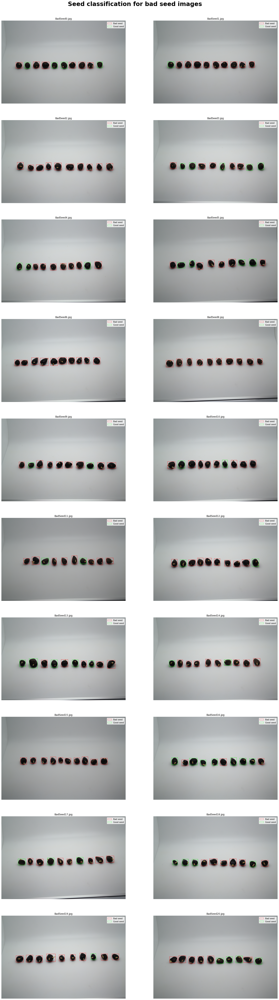

time: 1min 10s (started: 2021-04-09 23:43:39 +08:00)


In [ ]:
display_seed_classification('bad')

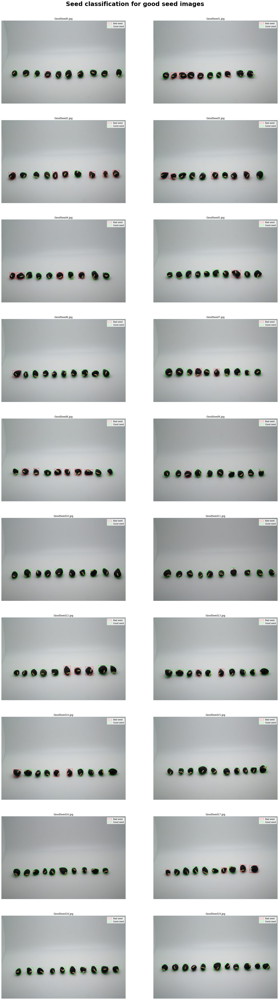

time: 1min 12s (started: 2021-04-09 23:44:49 +08:00)


In [ ]:
display_seed_classification('good')

## Zip and download all output files

In [ ]:
!zip -r BadSeedBound.zip seed/BadSeedBound
!zip -r GoodSeedBound.zip seed/GoodSeedBound
!zip -r BadSeedBoundTest.zip seed/BadSeedBoundTest
!zip -r GoodSeedBoundTest.zip seed/GoodSeedBoundTest
!zip -r BadSeedCropped.zip seed/BadSeedCropped
!zip -r GoodSeedCropped.zip seed/GoodSeedCropped

# Uncomment to download any specific output files
# files.download('BadSeedBound.zip')
# files.download('GoodSeedBound.zip')
# files.download('BadSeedBoundTest.zip')
# files.download('GoodSeedBoundTest.zip')
# files.download('BadSeedCropped.zip')
# files.download('GoodSeedCropped.zip')

  adding: seed/BadSeedBound/ (stored 0%)
  adding: seed/BadSeedBound/BadSeed9.jpg (deflated 1%)
  adding: seed/BadSeedBound/BadSeed58.jpg (deflated 1%)
  adding: seed/BadSeedBound/BadSeed8.jpg (deflated 1%)
  adding: seed/BadSeedBound/BadSeed72.jpg (deflated 1%)
  adding: seed/BadSeedBound/BadSeed102.jpg (deflated 1%)
  adding: seed/BadSeedBound/BadSeed33.jpg (deflated 1%)
  adding: seed/BadSeedBound/BadSeed14.jpg (deflated 1%)
  adding: seed/BadSeedBound/BadSeed16.jpg (deflated 1%)
  adding: seed/BadSeedBound/BadSeed68.jpg (deflated 1%)
  adding: seed/BadSeedBound/BadSeed59.jpg (deflated 1%)
  adding: seed/BadSeedBound/BadSeed21.jpg (deflated 1%)
  adding: seed/BadSeedBound/BadSeed70.jpg (deflated 1%)
  adding: seed/BadSeedBound/BadSeed93.jpg (deflated 1%)
  adding: seed/BadSeedBound/BadSeed11.jpg (deflated 2%)
  adding: seed/BadSeedBound/BadSeed97.jpg (deflated 1%)
  adding: seed/BadSeedBound/BadSeed15.jpg (deflated 2%)
  adding: seed/BadSeedBound/BadSeed95.jpg (deflated 1%)
  adding